# Imorting Libraries

In [1]:
#Before running this project, ensure you have the necessary libraries installed. Below are the required imports:

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import os
import matplotlib.pyplot as plt

from PIL import Image  # Import PIL to resize images
import shutil

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset,DataLoader, random_split
import random
from sklearn.model_selection import train_test_split

import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.metrics import classification_report, confusion_matrix
from torchmetrics.functional import structural_similarity_index_measure as ssim

import seaborn as sns
from torchvision.transforms import RandomHorizontalFlip, RandomRotation, ColorJitter
if torch.cuda.is_available():
    device = torch.device("cuda")  # Set device to GPU
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")  # Fallback to CPU
    print("CUDA is not available. Using CPU.")

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


## CNN Model

In [2]:
import torch
import torch.nn as nn
from torchvision import models

# Define the model class (ResNet18 for single-channel input)
def get_resnet18_model(num_classes):
    model = models.resnet18(pretrained=False)  # pretrained=False as we load custom weights
    model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

# Function to load the model
def load_model(model, path):
    model.load_state_dict(torch.load(path))
    model.eval()  # Set the model to evaluation mode
    print(f'Model loaded from {path}')

# Specify the number of classes
num_classes = 4  # COVID-19, Normal, Lung Opacity, Viral Pneumonia

# Initialize the model and load the trained weights
model = get_resnet18_model(num_classes)

C:\Users\david\anaconda3\envs\MOSMED\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\david\anaconda3\envs\MOSMED\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [4]:
state_dict = torch.load('attack on chest model weights.pth')

C:\Users\david\AppData\Local\Temp\ipykernel_1212\3347430340.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('attack on chest model weights.pth')


In [5]:
model.load_state_dict(state_dict)

<All keys matched successfully>

In [6]:
model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## Data Preprocessing

In [8]:
transform =  transforms.Compose([
        transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

In [9]:
transform1 = transforms.Compose([
        transforms.Normalize([0.5], [0.5])
    ])

In [10]:
transform2 =  transforms.Compose([
        transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])

In [11]:
encoding = {'COVID':0,'Normal':2,'Lung_Opacity':1,'Viral Pneumonia':3}

## Attack

In [12]:
pip install torchattacks

Note: you may need to restart the kernel to use updated packages.


In [55]:
from torchattacks import PGD
attack = PGD(model)

In [56]:
# function to plot real and attacked images side by side
def plot(img,adv_img):
    img,adv_img = img.to('cpu'),adv_img.to('cpu')
    # weights = torch.tensor([0.2989, 0.5870, 0.1140]).view(3, 1, 1) # to convert RGB to Gray-Scale
    img = img.squeeze(0)
    adv_img = adv_img.squeeze(0)
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(img,cmap='gray')
    # ax[0].title(predicted_label.item())
    ax[1].imshow(adv_img,cmap='gray')
    # ax[1].title(adv_label.item())
    print(encoding)
    plt.show()

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


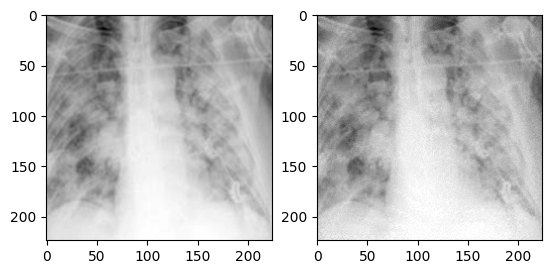

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


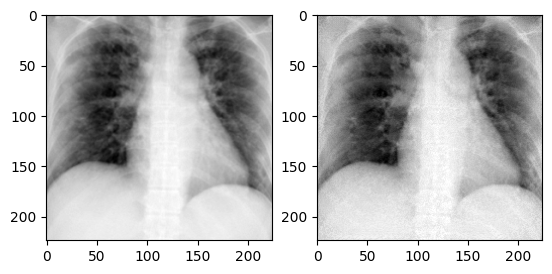

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


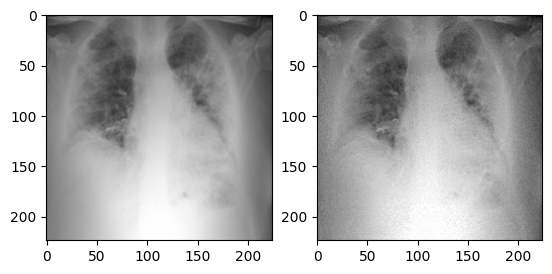

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


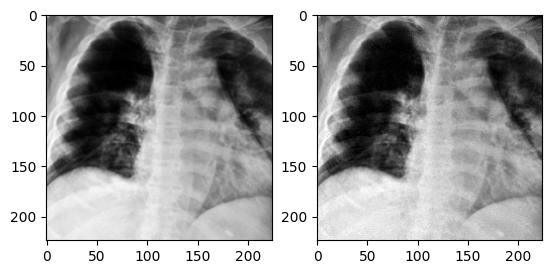

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


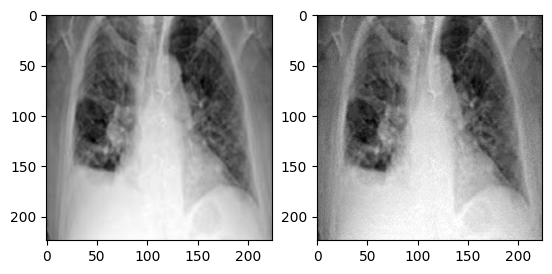

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


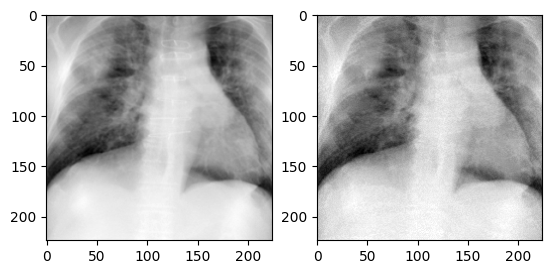

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


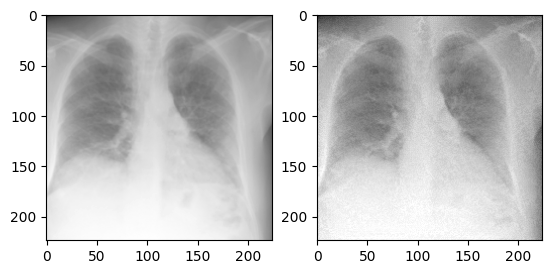

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


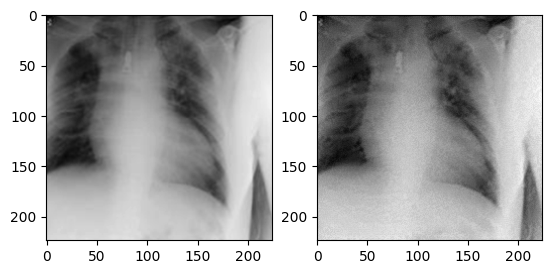

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


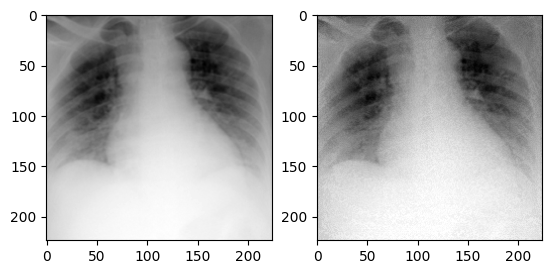

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


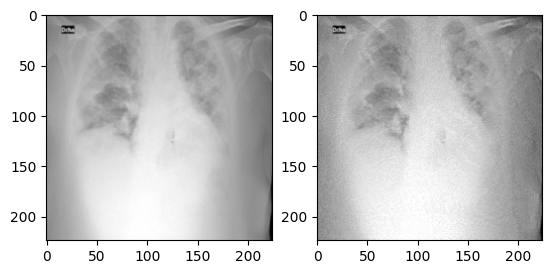

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


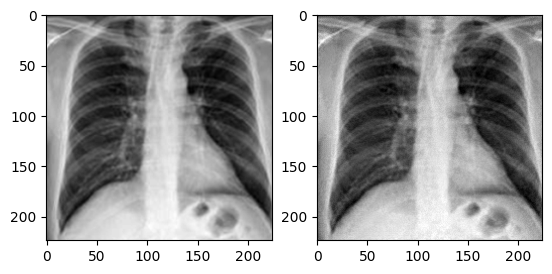

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


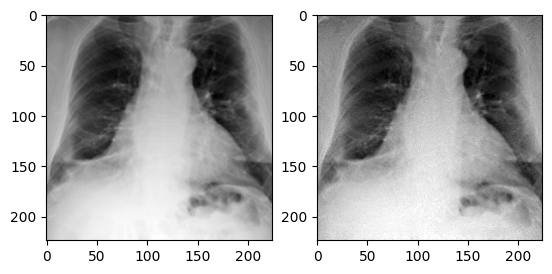

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


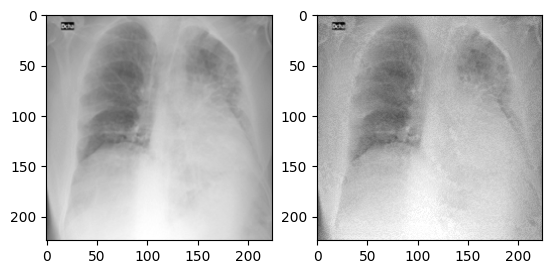

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


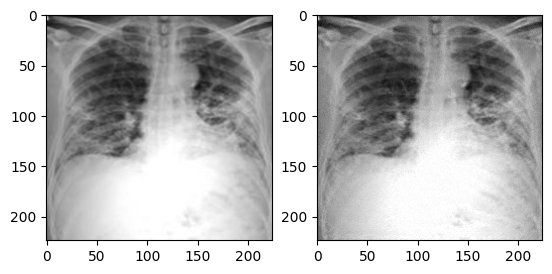

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


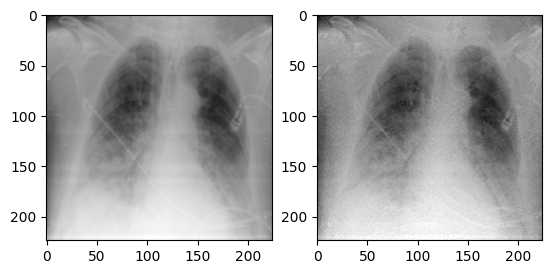

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


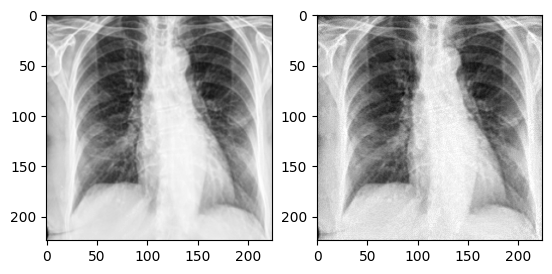

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


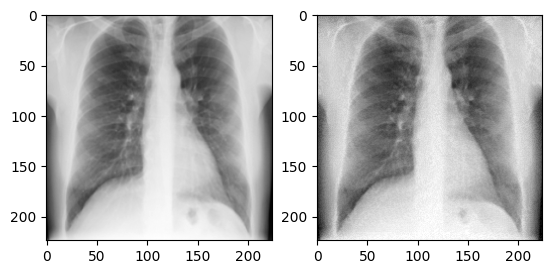

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


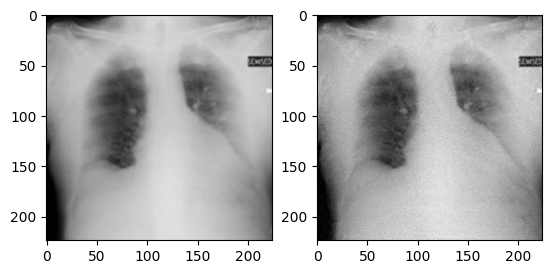

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


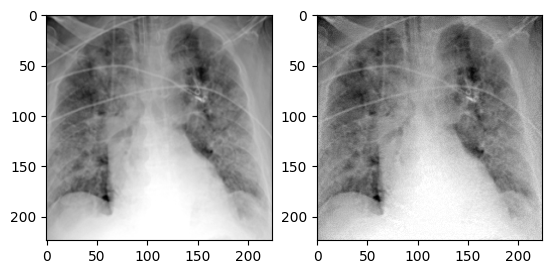

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


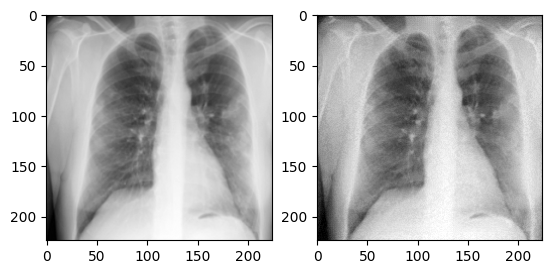

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


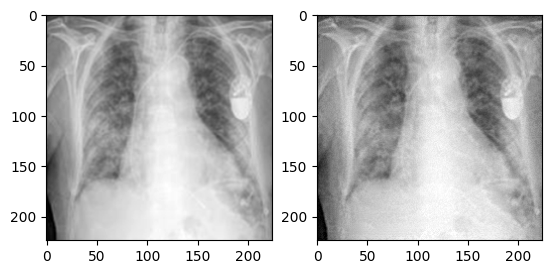

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


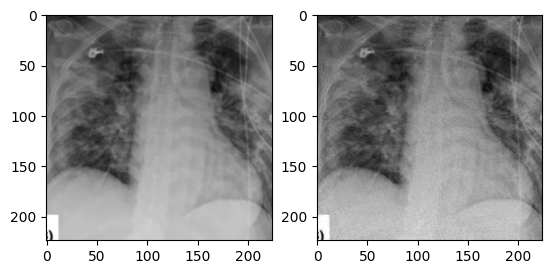

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


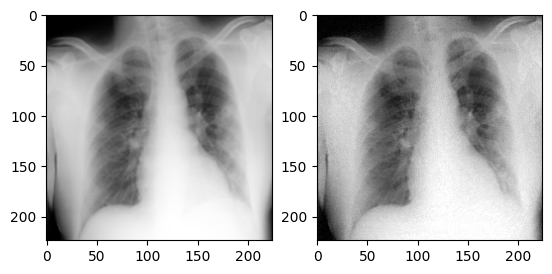

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


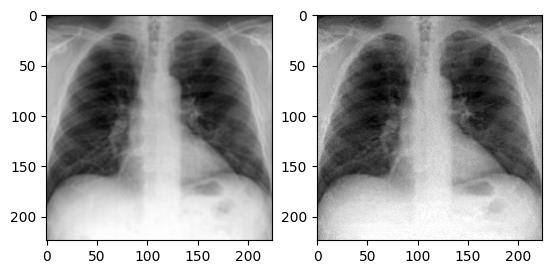

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


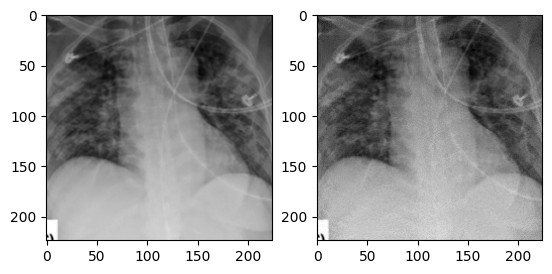

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


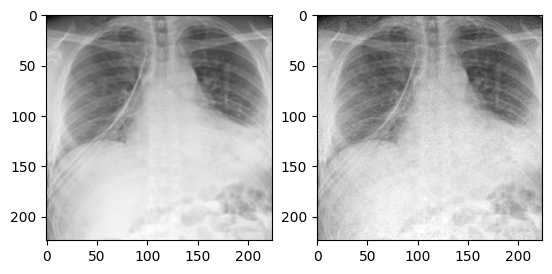

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


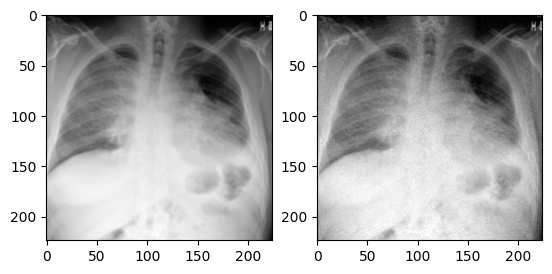

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


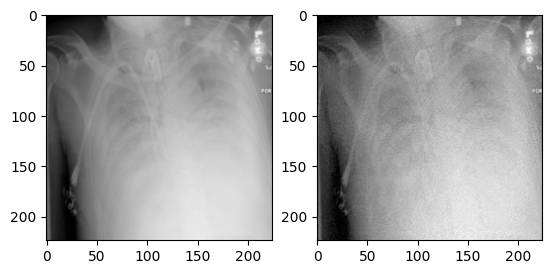

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


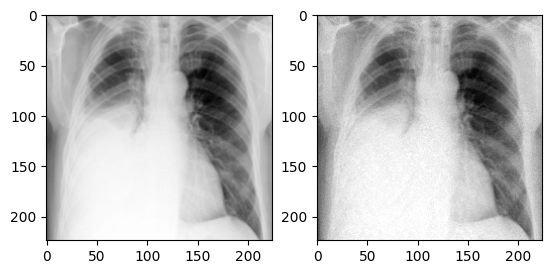

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


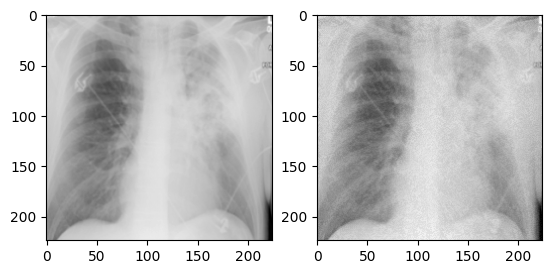

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


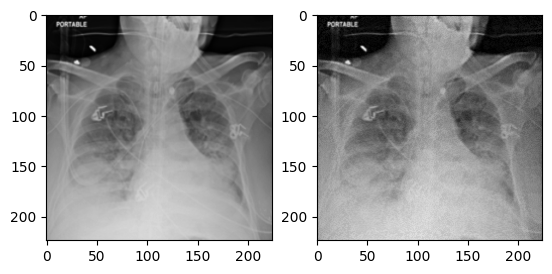

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


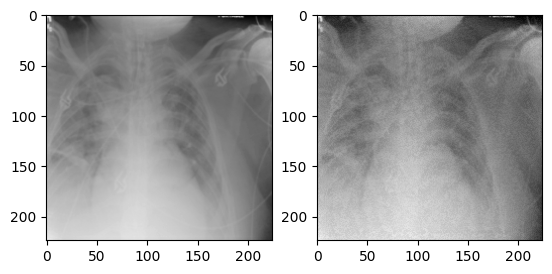

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


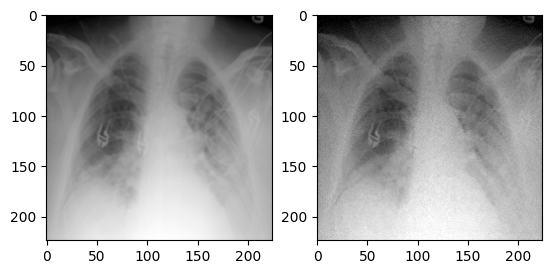

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


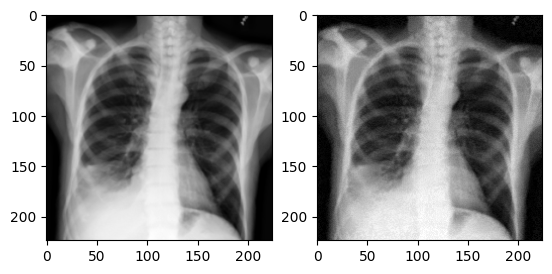

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


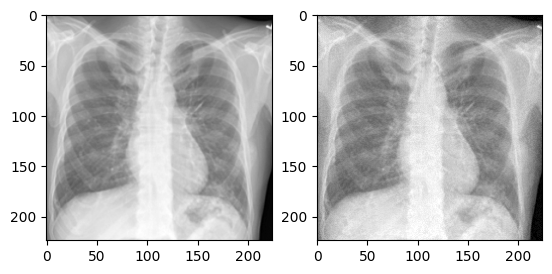

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


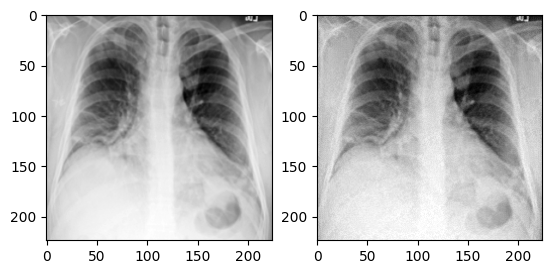

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


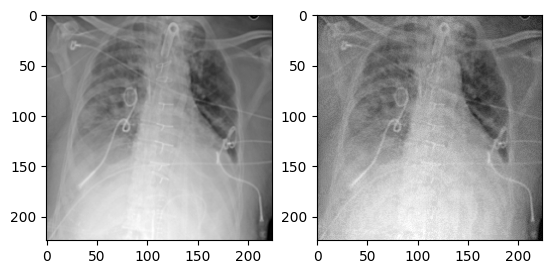

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


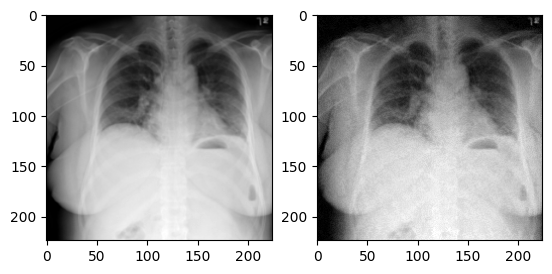

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


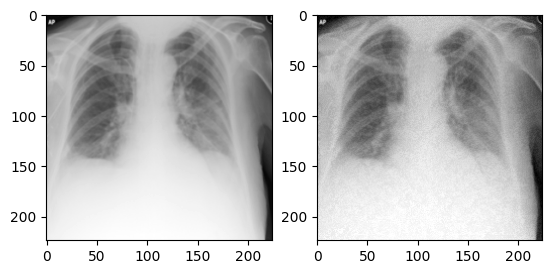

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


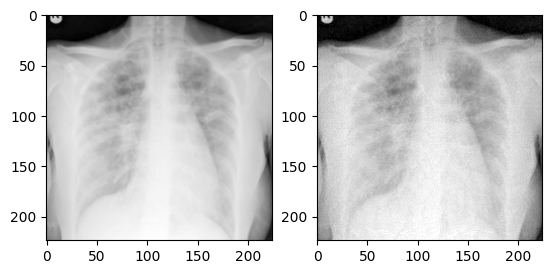

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


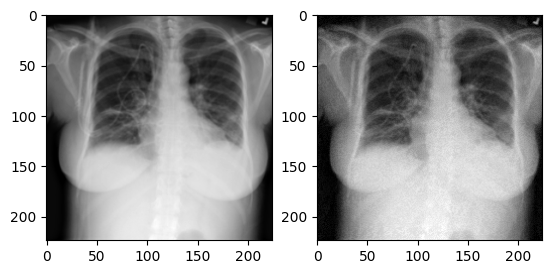

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


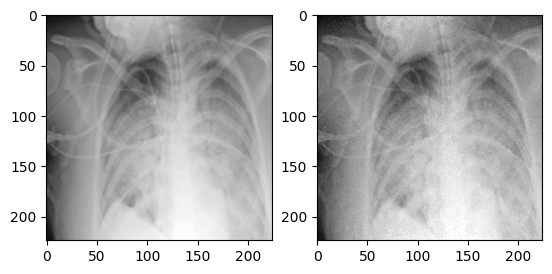

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


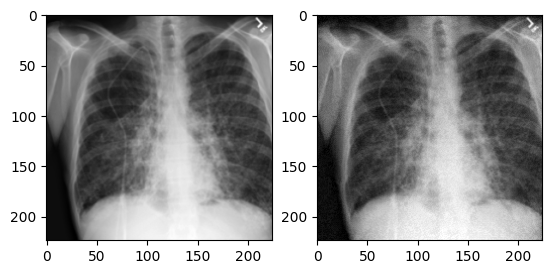

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


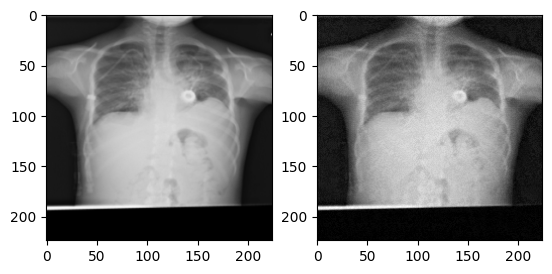

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


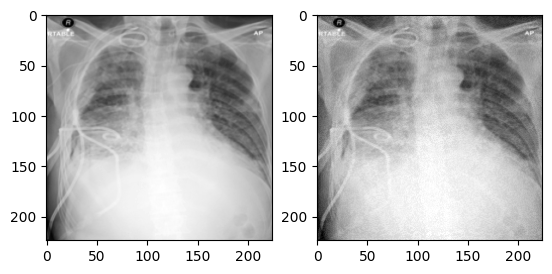

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


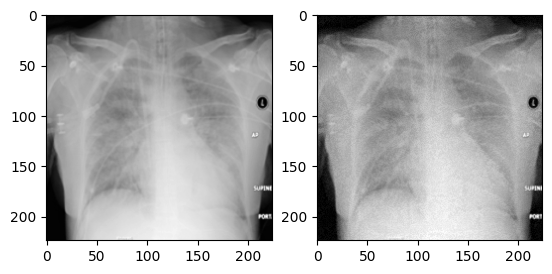

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


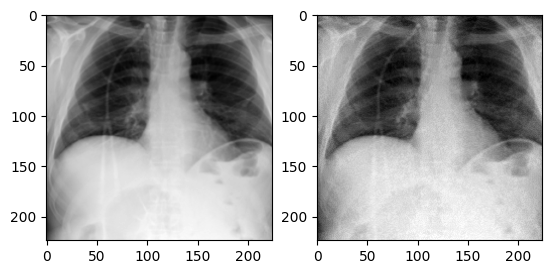

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


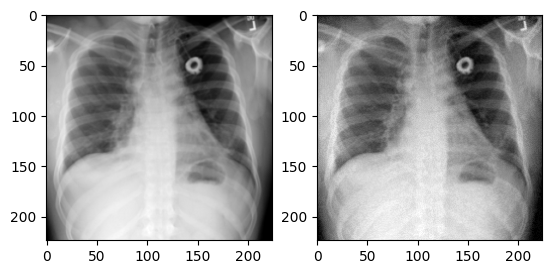

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


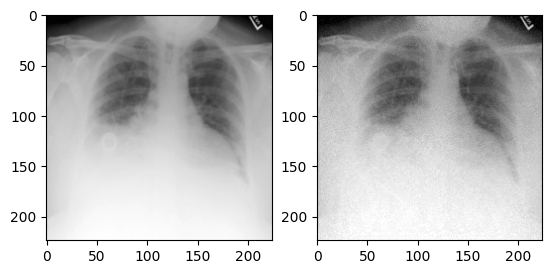

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


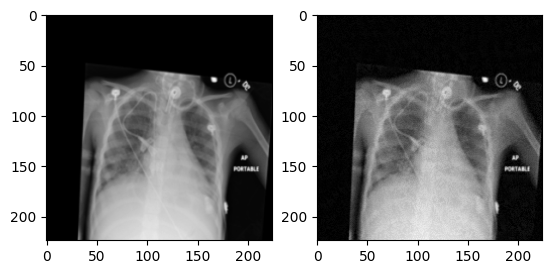

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


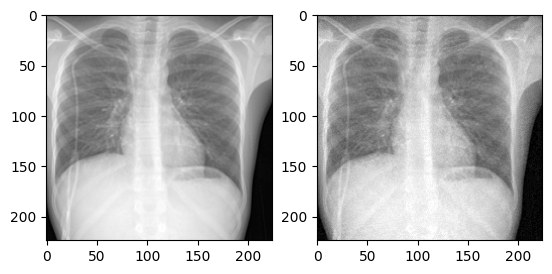

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


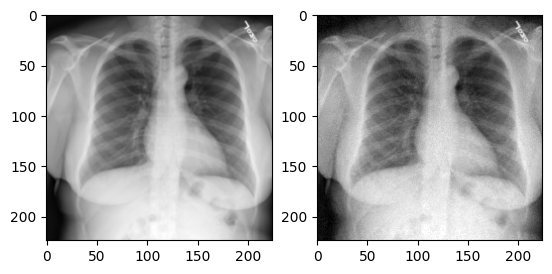

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


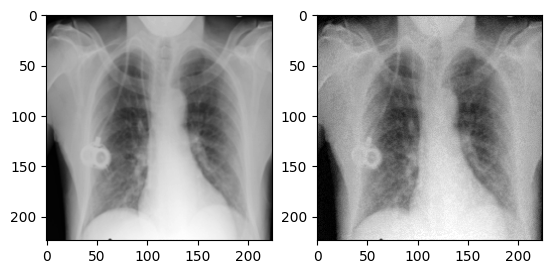

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


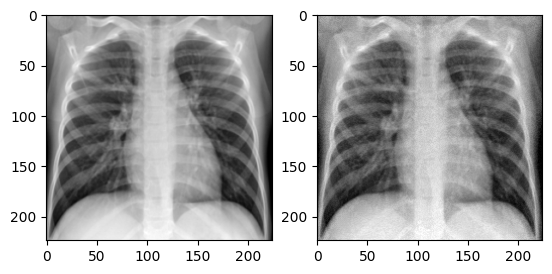

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


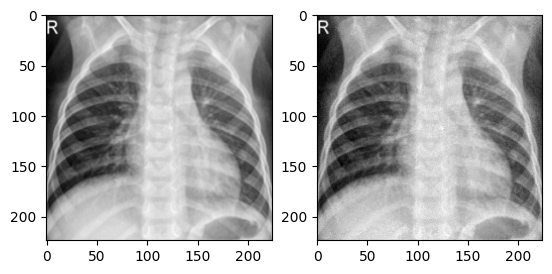

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


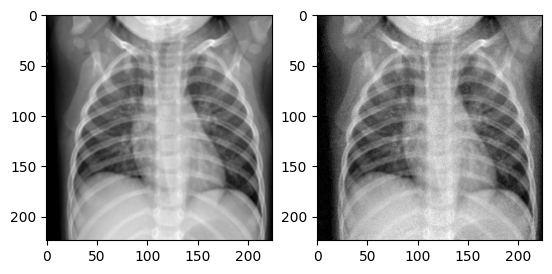

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


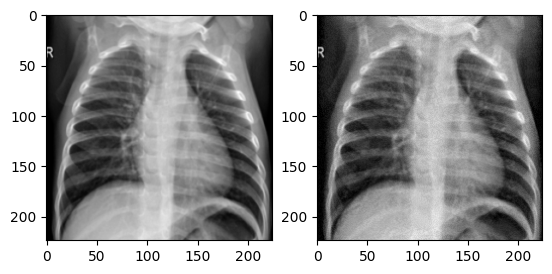

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


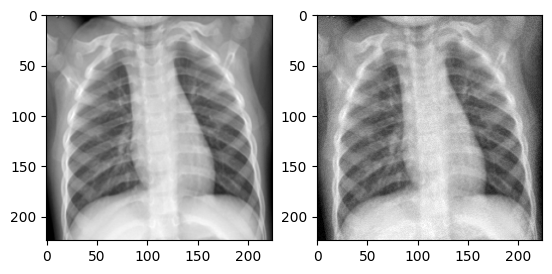

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


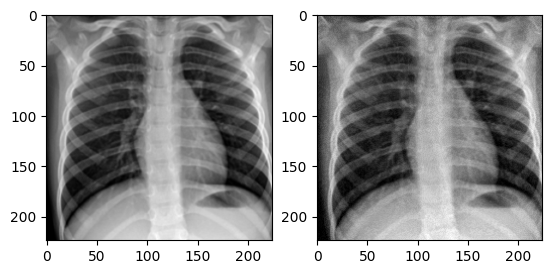

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


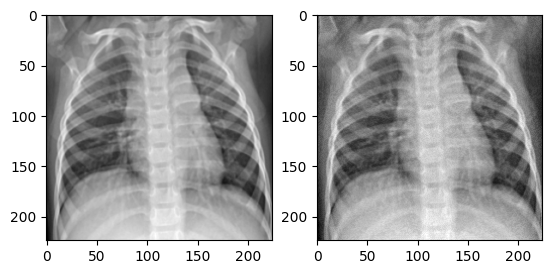

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


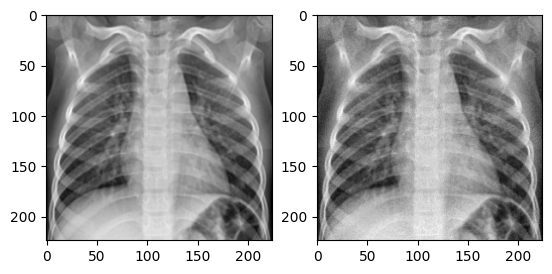

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


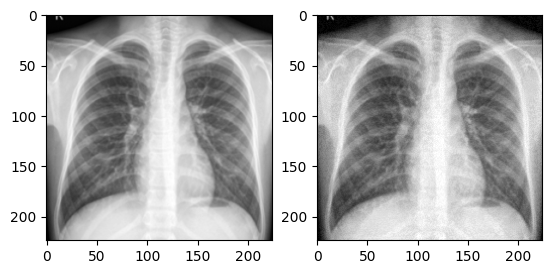

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


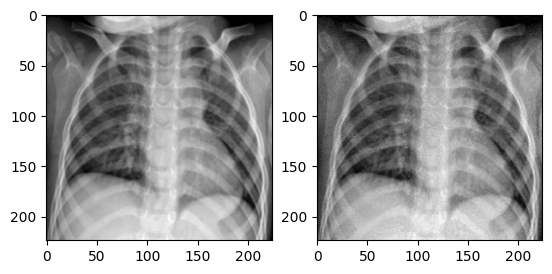

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


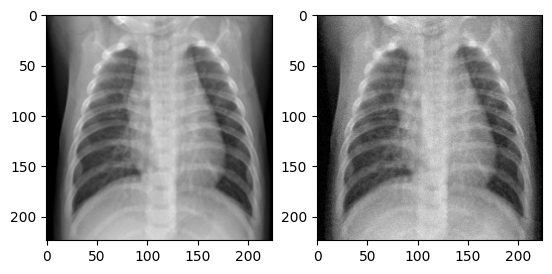

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


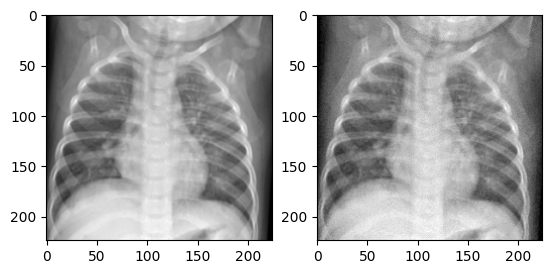

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


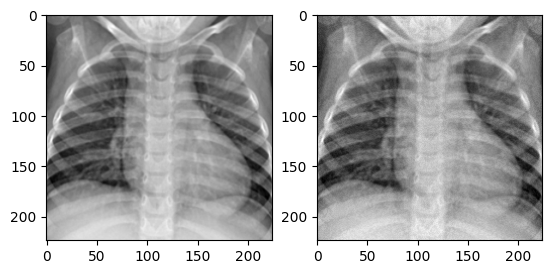

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


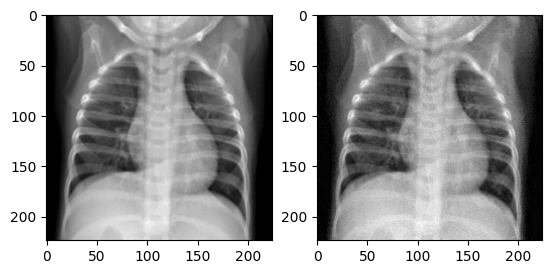

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


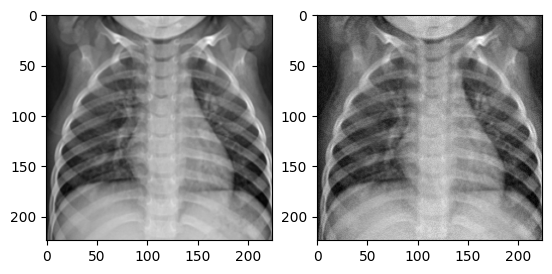

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


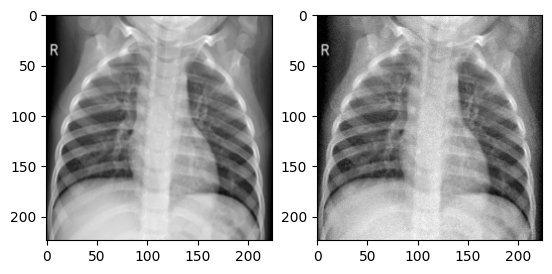

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


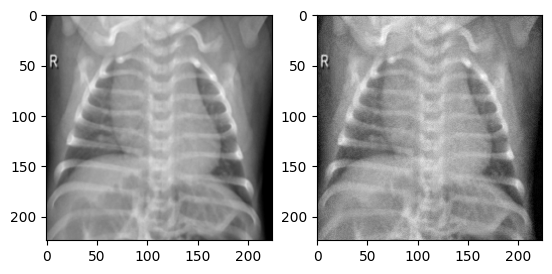

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


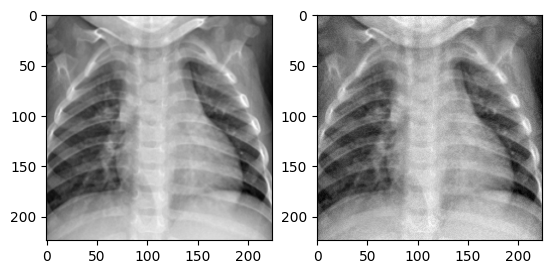

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


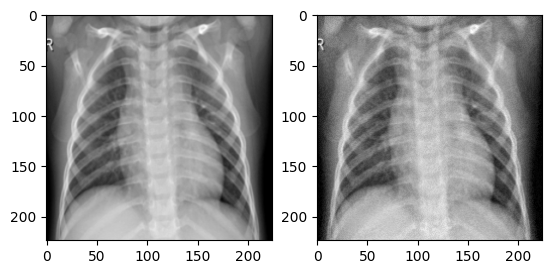

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


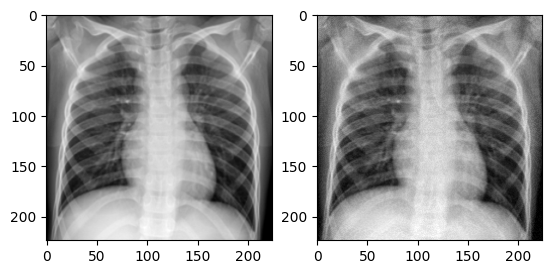

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


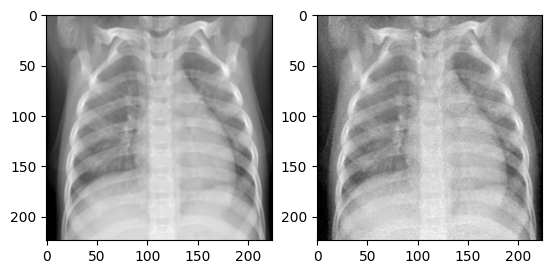

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


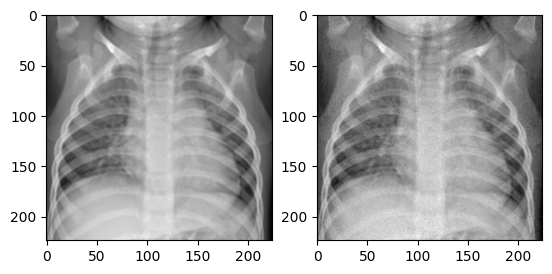

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


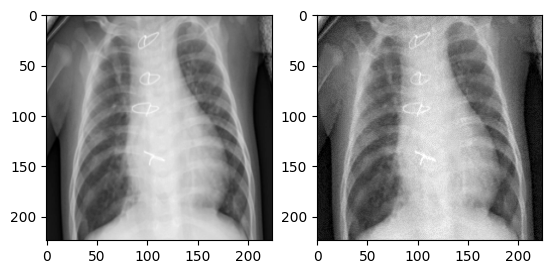

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


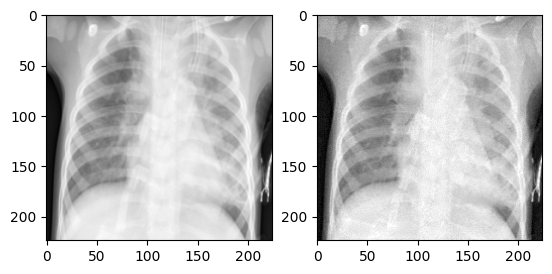

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


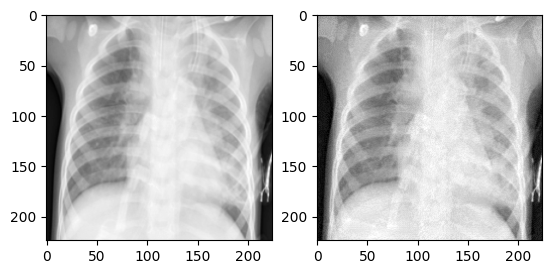

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


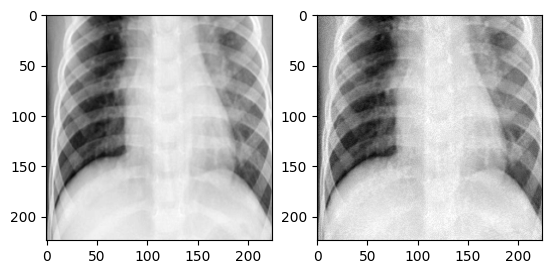

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


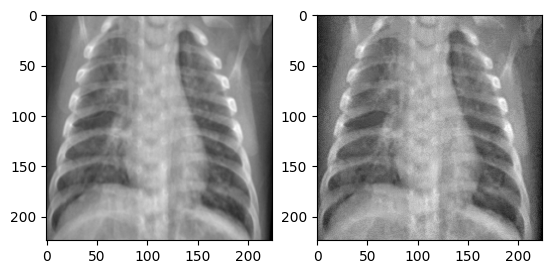

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


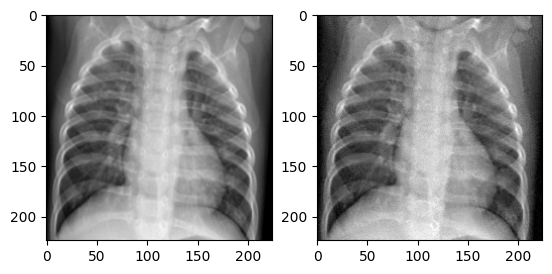

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


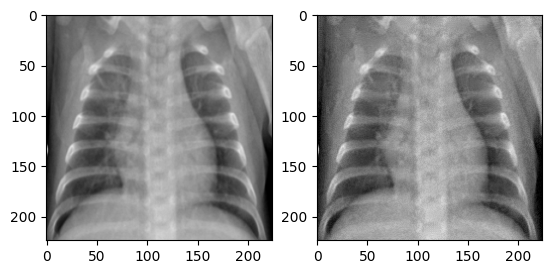

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


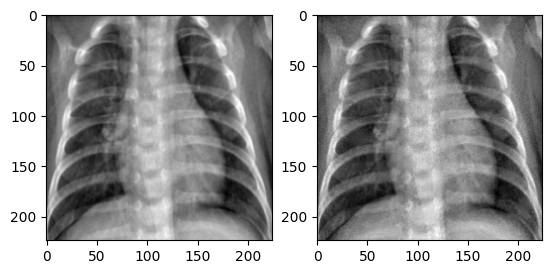

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


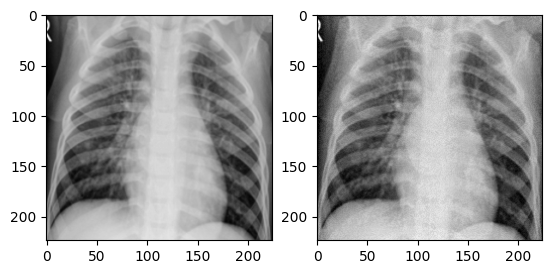

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


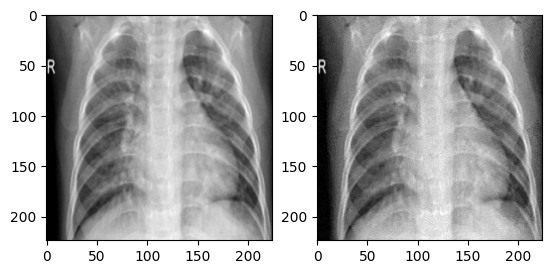

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


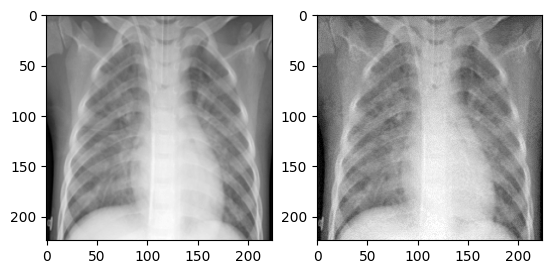

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


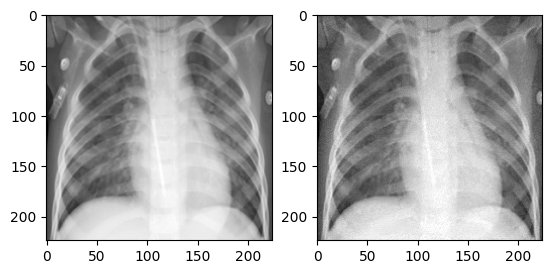

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


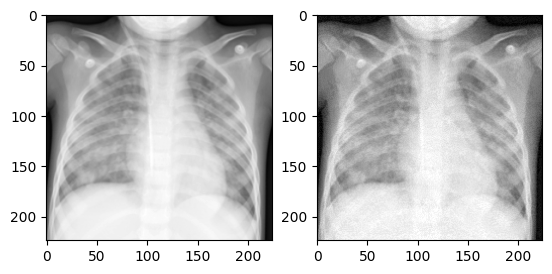

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


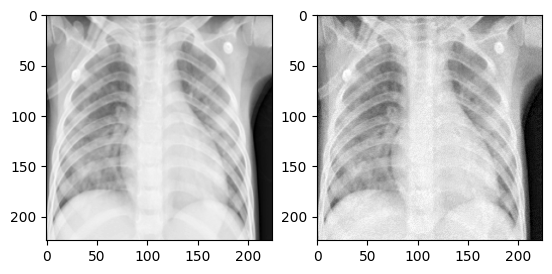

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


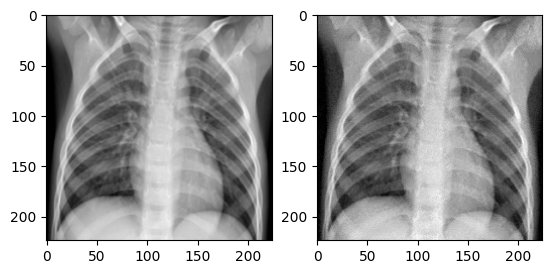

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


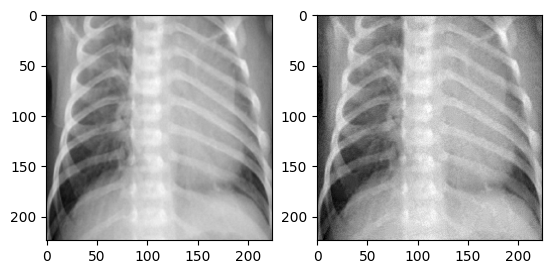

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


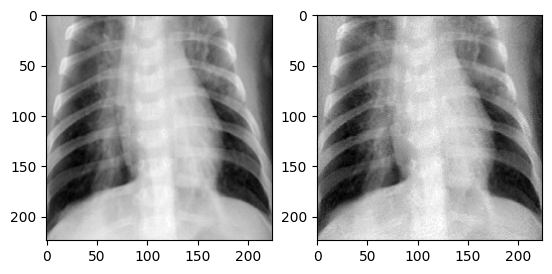

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


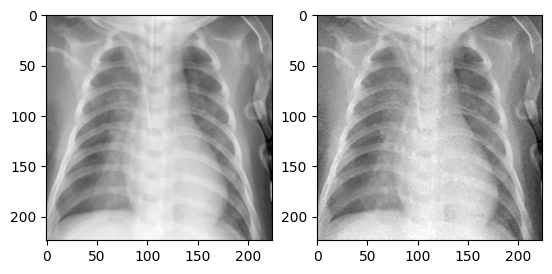

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


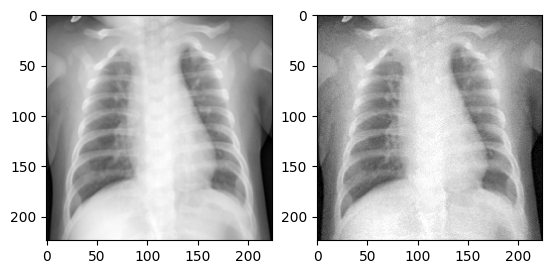

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


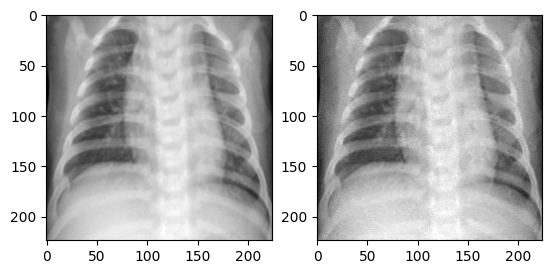

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


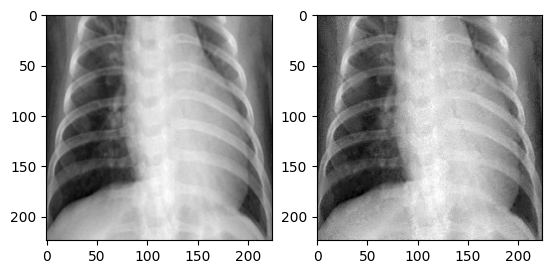

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


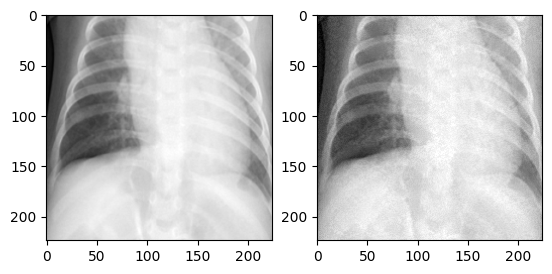

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


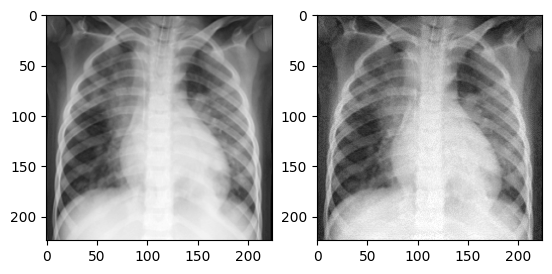

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


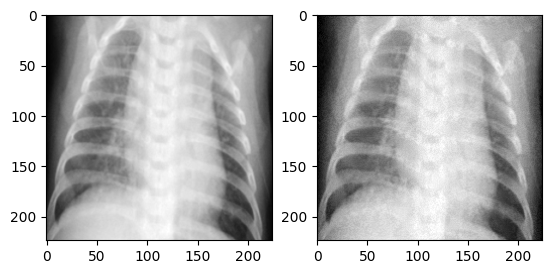

{'COVID': 0, 'Normal': 2, 'Lung_Opacity': 1, 'Viral Pneumonia': 3}


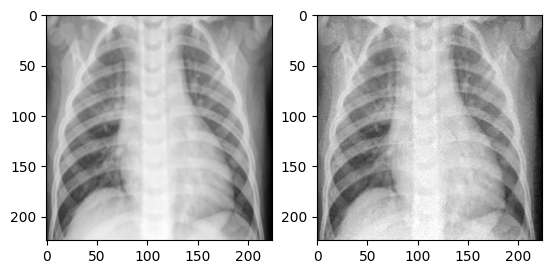

In [57]:
img_names=[]
true_labels = []
true_imgs = []
predicted_labels = []
adv_imgs = []
adv_predicted_labels = []

root_dir='ATTACKS(100_images)'
for classes in os.listdir(root_dir):
    next_dir = os.path.join(root_dir,classes)
    next_dir = os.path.join(next_dir,'images')
    
    for img_name in os.listdir(next_dir): # access each image 
        img_names.append(img_name)
        img_path = os.path.join(next_dir,img_name)

        image = Image.open(img_path)
        
        #Real Image
        real_img = transform(image).unsqueeze(0)
        true_imgs.append(real_img)
        label = encoding[classes]
        label_t = torch.tensor(label).unsqueeze(0)
        true_labels.append(label_t)
        
        #Adversarial Image Normalization
        img_tensor = transform2(image).unsqueeze(0)
        min_value = img_tensor.min()
        max_value = img_tensor.max()
        min_max_img = (img_tensor - img_tensor.min())/(img_tensor.max()-img_tensor.min())
              
        #Attacked Image
        adv_img = attack(min_max_img,label_t)
        
        # Converting back using Min and Max
        adv_img = (adv_img*(max_value-min_value))+min_value
        
        #Normalizing to [-1,1]
        adv_img = transform1(adv_img)
        adv_imgs.append(adv_img)
        
        # Actual Prediction
        output = model(real_img.to(device))
        prediction = torch.max(output.data,1)[1]
        predicted_labels.append(prediction)
    
        # Adversarial Prediction
        adv_output = model(adv_img.to(device))
        adv_prediction = torch.max(adv_output.data,1)[1]
        adv_predicted_labels.append(adv_prediction)

        plot(real_img.squeeze(0).detach(),adv_img.squeeze(0).detach())
    

### ASR

In [59]:
success = []
for i in range(len(true_labels)):
    success.append((adv_predicted_labels[i]!=true_labels[i].to(device)).item())
ASR = (sum(success)/len(success))*100
ASR

100.0

### SSIM

In [69]:
from torchmetrics.functional import structural_similarity_index_measure as ssim

In [70]:
ssim_scores=[]
for i in range(len(true_imgs)):
    adv_img = adv_imgs[i]
    real_img = true_imgs[i]
    adv_img = (adv_img - adv_img.min())/(adv_img.max()-adv_img.min())
    real_img = (real_img - real_img.min())/(real_img.max()-real_img.min())    
    ssim_score = ssim(real_img.to('cpu'),adv_img.to('cpu'),data_range=1.0)
    ssim_scores.append(ssim_score)
avg_ssim_score = (sum(ssim_scores)/len(ssim_scores)).item()
avg_ssim_score

0.8332111835479736

# LPIPS

In [53]:
import lpips
import torch
from PIL import Image
import torchvision.transforms as transforms

# Initialize the LPIPS model (default uses AlexNet backbone)
loss_fn = lpips.LPIPS(net='alex')  # Choices: 'alex', 'vgg', 'squeeze'

# Load real and adversarial images
def load_image(image):
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize to match input size for LPIPS
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    return transform(image)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\david\anaconda3\envs\MOSMED\Lib\site-packages\lpips\weights\v0.1\alex.pth


In [71]:
lpips_scores=[]
for i in range(len(true_imgs)):
    adv_img = adv_imgs[i].to('cpu')
    real_img = true_imgs[i]
    adv_img = (adv_img - adv_img.min())/(adv_img.max()-adv_img.min())
    real_img = (real_img - real_img.min())/(real_img.max()-real_img.min())
    image = load_image(real_img)
    adv_image = load_image(adv_img)
    lpips_distance = loss_fn(image.float(), adv_image.float())
    lpips_scores.append(lpips_distance)
avg_lpips_score = (sum(lpips_scores)/len(lpips_scores)).item()
avg_lpips_score

0.18885073065757751

## SVD Analysis

In [564]:
def SVD(img,adv_img):
    img,adv_img = img.to('cpu'),adv_img.to('cpu')
    img = img.squeeze(0).squeeze(0)
    adv_img = adv_img.squeeze(0).squeeze(0)
    U_img, S_img, Vt_img = np.linalg.svd(img)
    U_adv, S_adv, Vt_adv = np.linalg.svd(adv_img)
    return U_img, S_img, Vt_img,U_adv, S_adv, Vt_adv

In [567]:
U_img_list=[]
S_img_list=[]
V_img_list=[]
U_adv_list=[]
S_adv_list=[]
V_adv_list=[]
for i in range(len(true_imgs)):
    U_img, S_img, Vt_img,U_adv, S_adv, Vt_adv = SVD(true_imgs[i].detach(),adv_imgs[i].detach())
    U_img_list.append(U_img)
    S_img_list.append(S_img)
    V_img_list.append(Vt_img)
    U_adv_list.append(U_adv)
    S_adv_list.append(S_adv)
    V_adv_list.append(Vt_adv)
    

In [568]:
U_img_list = np.array(U_img_list)
S_img_list = np.array(S_img_list)
V_img_list = np.array(V_img_list)
U_adv_list = np.array(U_adv_list)
S_adv_list = np.array(S_adv_list)
V_adv_list = np.array(V_adv_list)

In [569]:
np.save('SVD_Real_Images/U_img_list.npy',U_img_list)
np.save('SVD_Real_Images/S_img_list.npy',S_img_list)
np.save('SVD_Real_Images/V_img_list.npy',V_img_list)
np.save('SVD_ADV_Images/U_adv_list.npy',U_adv_list)
np.save('SVD_ADV_Images/S_adv_list.npy',S_adv_list)
np.save('SVD_ADV_Images/V_adv_list.npy',V_adv_list)